# About Stochastic Gradient Descent, Momentum and Nesterov Acceleration for Deep Learning

This notebook aims to explore some works about stochastic gradient descent declinations to train deep neural networks, presented in [On the importance of initialization and momentum in deep learning](http://www.cs.toronto.edu/~hinton/absps/momentum.pdf). It implements optimization algorithms to minimize a quadratic objective function and to train a deep auto-encoder on MNIST. You can find some details about the deep auto-encoder in [Reducing the Dimensionality of Data with Neural Networks](https://www.cs.toronto.edu/~hinton/science.pdf) and Nesterov Momentum reformulation in [Advances in Optimizing Recurrent Networks](https://arxiv.org/pdf/1212.0901.pdf). An additional resource could be [Ilya Sutskever's thesis](http://www.cs.utoronto.ca/~ilya/pubs/ilya_sutskever_phd_thesis.pdf).

Function to minimize : $f : \theta \rightarrow f(\theta) \in \mathbb{R}$

## SGD
* Initialization : 
    * Learning rate $\epsilon > 0$,
    * Trainable parameters $\theta_0$
* Iteration :
    * $\theta_{t+1} = \theta_t - \epsilon \nabla f(\theta_t)$


## Momentum SGD
* Initialization : 
    * Learning rate $\epsilon > 0$, Momentum $\mu \in [0, 1]$
    * Trainable parameters $\theta_0$
    * $v_0 \leftarrow 0$
* Iteration :
    * $v_{t+1} = \mu v_t - \epsilon \nabla f(\theta_t)$
    * $\theta_{t+1} = \theta_t + v_{t+1}$
    
## Nesterov Momentum (S)GD
* Initialization :
    * Learning rate $\epsilon > 0$, Momentum $\mu \in [0, 1]$
    * Trainable parameters $\theta_0$
    * $v_0 \leftarrow 0$
* Iteration :
    * $v_{t+1} = \mu v_t - \epsilon \nabla f(\theta_t + \mu v_t)$
    * $\theta_{t+1} = \theta_t + v_{t+1}$
    
## Reformulation for Nesterov Momentum SGD
Initial input : $\theta_t$ <br>
Reformulated input : $\tilde{\theta}_t = \theta_t + \mu v_t$ ($\Leftrightarrow \theta_t = \tilde{\theta}_t - \mu v_t$)

First iteration step :
* $v_{t+1} = \mu v_t - \epsilon \nabla f(\tilde{\theta}_t)$

Since,
\begin{equation}
    \theta_{t+1} = \theta_t + v_{t+1} \\
    \theta_{t+1} = \tilde{\theta}_t - \mu v_t + v_{t+1}
\end{equation}
Moreover, 
\begin{equation}
    \tilde{\theta}_{t+1} = \theta_{t+1} + \mu v_{t+1} \\
    \tilde{\theta}_{t+1} = \tilde{\theta}_t - \mu v_t + v_{t+1} + \mu v_{t+1}
\end{equation}

Thus, the second iteration step :
* $\tilde{\theta}_{t+1} = \tilde{\theta}_t - \mu v_t + (1 + \mu) v_{t+1}$

The final Nesterov Momentum SGD iteration becomes :
* $v_{t+1} = \mu v_t - \epsilon \nabla f(\tilde{\theta}_t)$
* $\tilde{\theta}_{t+1} = \tilde{\theta}_t - \mu v_t + (1 + \mu) v_{t+1}$

In Python code :

```python
previous_v = v
v = mu * v - eps * grad_x

if nesterov :
    x = x - mu * previous_v + (1 + mu) * v
    
else :
    x = x + v
```

# Packages

In [1]:
import os
import math
import tqdm
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import tensorflow as tf
import tensorflow_datasets as tfds
import tensorflow_hub as hub

import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [2]:
def set_tqdm_notebook():

    tqdm.tqdm_notebook()
    tqdm.notebook.tqdm()

    return

set_tqdm_notebook()

/anaconda3/envs/tensorflow_env/lib/python3.6/site-packages/ipykernel_launcher.py:3: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



In [3]:
import logging

In [4]:
logging.info('This is cool !')

In [7]:
from tensorflow.keras.utils import Progbar
import time 
#import numpy as np

metrics_names = ['acc','pr'] 

num_epochs = 5
num_training_samples = 100
batch_size = 10

for i in range(num_epochs):
    print("\nepoch {}/{}".format(i+1,num_epochs))

    pb_i = Progbar(num_training_samples, stateful_metrics=metrics_names)

    for j in range(num_training_samples//batch_size):

        time.sleep(0.3)
        values=[('acc', np.random.random(1)), ('pr', np.random.random(1))]
        pb_i.add(batch_size, values=values)


epoch 1/5
100/100 [==============================] - 3s 30ms/step - acc: 0.0988 - pr: 0.9417

epoch 2/5
100/100 [==============================] - 3s 30ms/step - acc: 0.1938 - pr: 0.0589

epoch 3/5
100/100 [==============================] - 3s 31ms/step - acc: 0.1654 - pr: 0.5682

epoch 4/5
100/100 [==============================] - 3s 31ms/step - acc: 0.1406 - pr: 0.3040

epoch 5/5
100/100 [==============================] - 3s 30ms/step - acc: 0.6669 - pr: 0.2648


# Quadratic Objective Function

In [3]:
interval_x = tf.range(-300, 300, 1).numpy().tolist()
interval_y = tf.range(-300, 300, 1).numpy().tolist()

In [39]:
x_y_values_df = pd.DataFrame({'interval_x': interval_x, 'interval_y': interval_y})
print(x_y_values_df.shape)
x_y_values_df.head()

(600, 2)


,interval_x,interval_y
0,-300,-300
1,-299,-299
2,-298,-298
3,-297,-297
4,-296,-296


In [40]:
x_y_values_df.to_json('x_y_values.json')

In [4]:
def quadratic_objective(x, tensor_output=True):
    
    """ q(x) = x^T.A.x + b^T.x
    """
    
    if not tf.is_tensor(x):
        x = tf.constant(x, shape=[2, 1], dtype=tf.float32)
    
    A = tf.constant([[1, 2], [2, 5]], shape=[2, 2], dtype=tf.float32)
    b = tf.constant([3, 3], shape=[2, 1], dtype=tf.float32)
    
    output = tf.squeeze(tf.matmul(tf.matmul(x, A, transpose_a=True), x) + tf.matmul(b, x, transpose_a=True))
    
    if not tensor_output:
        return output.numpy()
    
    return output

In [5]:
z_value = np.array([[quadratic_objective((x, y), tensor_output=False) for x in interval_x] for y in interval_y])

In [37]:
z_value[0][:5]

array([898200., 896404., 894610., 892818., 891028.], dtype=float32)

In [35]:
z_values_df = pd.DataFrame(z_value, columns=[f"value_{i}" for i in range(z_value.shape[0])])
print(z_values_df.shape)
z_values_df.head()

(600, 600)


,value_0,value_1,value_2,value_3,value_4,value_5,value_6,value_7,value_8,value_9,...,value_590,value_591,value_592,value_593,value_594,value_595,value_596,value_597,value_598,value_599
0,898200.0,896404.0,894610.0,892818.0,891028.0,889240.0,887454.0,885670.0,883888.0,882108.0,...,186070.0,185454.0,184840.0,184228.0,183618.0,183010.0,182404.0,181800.0,181198.0,180598.0
1,894008.0,892216.0,890426.0,888638.0,886852.0,885068.0,883286.0,881506.0,879728.0,877952.0,...,184238.0,183626.0,183016.0,182408.0,181802.0,181198.0,180596.0,179996.0,179398.0,178802.0
2,889826.0,888038.0,886252.0,884468.0,882686.0,880906.0,879128.0,877352.0,875578.0,873806.0,...,182416.0,181808.0,181202.0,180598.0,179996.0,179396.0,178798.0,178202.0,177608.0,177016.0
3,885654.0,883870.0,882088.0,880308.0,878530.0,876754.0,874980.0,873208.0,871438.0,869670.0,...,180604.0,180000.0,179398.0,178798.0,178200.0,177604.0,177010.0,176418.0,175828.0,175240.0
4,881492.0,879712.0,877934.0,876158.0,874384.0,872612.0,870842.0,869074.0,867308.0,865544.0,...,178802.0,178202.0,177604.0,177008.0,176414.0,175822.0,175232.0,174644.0,174058.0,173474.0


In [38]:
z_values_df.to_json('z_values.json')

In [9]:
fig = go.Figure(data=[
    go.Surface(
        z=z_value, 
        x=interval_x, 
        y=interval_y,
        opacity=0.5
    )
])

fig.update_layout(width=800, height=700, title='Quadratic Objective - Surface 3D')
fig.show()

In [10]:
class GradientDescentOptimizer:
    
    def __init__(self, func, learning_rate=0.1, momentum=0, nesterov=False): # tolerance & patience parameters ?
        
        if callable(func):
            self.func = func
        
        else:
            raise TypeError("func object is not callable")
        
        self.learning_rate = learning_rate
        self.momentum = momentum
        self.nesterov = nesterov
        
        self.iteration = 0
     
    def optimize(self, initial_x): # initial_x = tf.random.normal(shape=[2, 1], mean=0., stddev=1000.)
        
        # Initialization
        self.x = tf.Variable(initial_x)
        self.argmin = tf.Variable(initial_x)
        self.velocity = tf.zeros(self.x.shape)
        self.history = {'min': [], 'argmin': []}
            
        # Iteration
        while self.func(self.x) <= self.func(self.argmin):
            
            self.argmin.assign(self.x)

            with tf.GradientTape() as tape: 
                value_func = self.func(self.x)

            gradient = tape.gradient(value_func, self.x)
            learning_rate = self.get_lr()
            momentum = self.get_momentum()
            v = momentum * self.velocity - learning_rate * gradient
            
            if self.nesterov:
                self.x.assign_add(- momentum * self.velocity + (1 + momentum) * v)
                
            else:
                self.x.assign_add(v)

            self.velocity = v
            self.history['min'].append(self.func(self.argmin).numpy())
            self.history['argmin'].append(self.argmin.numpy())
            
            print(f"Iteration : {self.iteration}. Value Function : {self.history['min'][-1]}.")
            print(f"argmin : {np.reshape(self.history['argmin'][-1], (2,))}\n")
            
            self.iteration += 1
            
        self.history_df = pd.DataFrame(
            np.hstack([
                np.concatenate(self.history['argmin'], axis=1).T, 
                np.expand_dims(np.array(self.history['min']), axis=1)
            ]), 
            columns=['x', 'y', 'f(x,y)'],
        )
        self.history_df.index.name = 'Iteration'
        
        return
    
    def get_lr(self):
        
        if callable(self.learning_rate):
            return self.learning_rate(self.iteration)
        
        return self.learning_rate
                  
    def get_momentum(self):
                  
        if callable(self.momentum):
            return self.momentum(self.iteration)
                  
        return self.momentum

In [11]:
initial_x = tf.random.normal(shape=[2, 1], mean=0., stddev=1000.)

gradient_descent_optimizer = GradientDescentOptimizer(quadratic_objective, learning_rate=0.1)
gradient_descent_optimizer.optimize(initial_x)

print(gradient_descent_optimizer.history_df.shape)
gradient_descent_optimizer.history_df.head()

.390364]

Iteration : 123. Value Function : 47.371028900146484.
argmin : [-20.563992   8.153923]

Iteration : 124. Value Function : 43.87224197387695.
argmin : [-20.012762    7.9255967]

Iteration : 125. Value Function : 40.60944747924805.
argmin : [-19.480448   7.705105]

Iteration : 126. Value Function : 37.56674575805664.
argmin : [-18.9664     7.492179]

Iteration : 127. Value Function : 34.729278564453125.
argmin : [-18.469992   7.28656 ]

Iteration : 128. Value Function : 32.083194732666016.
argmin : [-17.990618    7.0879965]

Iteration : 129. Value Function : 29.615604400634766.
argmin : [-17.527693   6.896247]

Iteration : 130. Value Function : 27.314420700073242.
argmin : [-17.080652    6.7110767]

Iteration : 131. Value Function : 25.16851234436035.
argmin : [-16.648952    6.5322614]

Iteration : 132. Value Function : 23.16731834411621.
argmin : [-16.232067    6.3595805]

Iteration : 133. Value Function : 21.301109313964844.
argmin : [-15.829486    6.1928267]

Iteration : 134

,x,y,"f(x,y)"
Iteration,,,
0,-1296.686890,213.158752,799729.000000
1,-1122.912964,518.374756,274322.906250
2,-1105.980225,448.865173,242876.640625
3,-1064.630249,442.092072,226138.625000
4,-1028.841064,425.552094,210875.140625


In [41]:
gradient_descent_optimizer.history_df.to_json('gradient_descent_history.json')

In [12]:
momentum_optimizer = GradientDescentOptimizer(quadratic_objective, learning_rate=0.1, momentum=0.1)
momentum_optimizer.optimize(initial_x)

print(momentum_optimizer.history_df.shape)
momentum_optimizer.history_df.head()



Iteration : 74. Value Function : 865.3652954101562.
argmin : [-70.28351   28.748419]

Iteration : 75. Value Function : 800.0150146484375.
argmin : [-67.76421   27.704895]

Iteration : 76. Value Function : 739.5741577148438.
argmin : [-65.3414    26.701332]

Iteration : 77. Value Function : 683.6744384765625.
argmin : [-63.01137   25.736206]

Iteration : 78. Value Function : 631.9739379882812.
argmin : [-60.770576  24.808037]

Iteration : 79. Value Function : 584.15771484375.
argmin : [-58.615597  23.915413]

Iteration : 80. Value Function : 539.9337158203125.
argmin : [-56.543144  23.056976]

Iteration : 81. Value Function : 499.0321044921875.
argmin : [-54.55006   22.231415]

Iteration : 82. Value Function : 461.20330810546875.
argmin : [-52.633305  21.437468]

Iteration : 83. Value Function : 426.21649169921875.
argmin : [-50.789955  20.673927]

Iteration : 84. Value Function : 393.8580627441406.
argmin : [-49.0172    19.939629]

Iteration : 85. Value Function : 363.9306945800781.


,x,y,"f(x,y)"
Iteration,,,
0,-1296.686890,213.158752,799729.000000
1,-1122.912964,518.374756,274322.906250
2,-1088.602905,479.386780,244839.671875
3,-1059.505981,431.242371,222902.578125
4,-1017.492065,418.687927,205945.046875


In [42]:
momentum_optimizer.history_df.to_json('momentum_history.json')

In [13]:
nesterov_optimizer = GradientDescentOptimizer(quadratic_objective, learning_rate=0.1, momentum=0.7, nesterov=True) # momentum = 0.7, iteration = 49
nesterov_optimizer.optimize(initial_x)

print(nesterov_optimizer.history_df.shape)
nesterov_optimizer.history_df.head()

Iteration : 0. Value Function : 799729.0.
argmin : [-1296.6869    213.15875]

Iteration : 1. Value Function : 749220.3125.
argmin : [-1001.27124   732.026  ]

Iteration : 2. Value Function : 291246.90625.
argmin : [-1073.9775    317.49213]

Iteration : 3. Value Function : 200939.4375.
argmin : [-911.1249   449.64874]

Iteration : 4. Value Function : 147286.828125.
argmin : [-854.8658   318.55124]

Iteration : 5. Value Function : 113347.203125.
argmin : [-743.4007   325.89374]

Iteration : 6. Value Function : 87251.25.
argmin : [-665.01355  265.85004]

Iteration : 7. Value Function : 66592.1171875.
argmin : [-577.9418   243.75702]

Iteration : 8. Value Function : 50248.66015625.
argmin : [-505.21002  206.4966 ]

Iteration : 9. Value Function : 37488.0390625.
argmin : [-435.90393  181.41911]

Iteration : 10. Value Function : 27670.19921875.
argmin : [-375.7577   154.65587]

Iteration : 11. Value Function : 20221.48046875.
argmin : [-321.5929   133.16212]

Iteration : 12. Value Function :

,x,y,"f(x,y)"
Iteration,,,
0,-1296.686890,213.158752,799729.000000
1,-1001.271240,732.026001,749220.312500
2,-1073.977539,317.492126,291246.906250
3,-911.124878,449.648743,200939.437500
4,-854.865784,318.551239,147286.828125


In [43]:
nesterov_optimizer.history_df.to_json('nesterov_history.json')

In [14]:
fig = go.Figure(data=[
    go.Surface(
        z=z_value, 
        x=interval_x, 
        y=interval_y,
        opacity=0.5
    ),
    go.Scatter3d(
        x=gradient_descent_optimizer.history_df['x'],
        y=gradient_descent_optimizer.history_df['y'],
        z=gradient_descent_optimizer.history_df['f(x,y)'],
        mode='lines+markers',
        name='GD'
    ),
    go.Scatter3d(
        x=momentum_optimizer.history_df['x'],
        y=momentum_optimizer.history_df['y'],
        z=momentum_optimizer.history_df['f(x,y)'],
        mode='lines+markers',
        name='Momentum'
    ),
    go.Scatter3d(
        x=nesterov_optimizer.history_df['x'],
        y=nesterov_optimizer.history_df['y'],
        z=nesterov_optimizer.history_df['f(x,y)'],
        mode='lines+markers',
        name='Nesterov'
    )
])

fig.update_layout(
    width=1000, 
    height=800, 
    legend=dict(
        orientation='v',
        y=1,
        x=0,
        bgcolor='white',
        bordercolor='lightgrey',
        borderwidth=0.5
    )
)
fig.show()

# Deep Auto-Encoder - Baseline Optimization with Adam
## Load Train & Test Datasets

In [15]:
mnist_train, info = tfds.load(name='mnist', split='train', as_supervised=True, with_info=True)
mnist_test = tfds.load(name='mnist', split='test', as_supervised=True)

print(info)

tfds.core.DatasetInfo(
    name='mnist',
    version=1.0.0,
    description='The MNIST database of handwritten digits.',
    urls=['https://storage.googleapis.com/cvdf-datasets/mnist/'],
    features=FeaturesDict({
        'image': Image(shape=(28, 28, 1), dtype=tf.uint8),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=10),
    }),
    total_num_examples=70000,
    splits={
        'test': 10000,
        'train': 60000,
    },
    supervised_keys=('image', 'label'),
    citation="""@article{lecun2010mnist,
      title={MNIST handwritten digit database},
      author={LeCun, Yann and Cortes, Corinna and Burges, CJ},
      journal={ATT Labs [Online]. Available: http://yann. lecun. com/exdb/mnist},
      volume={2},
      year={2010}
    }""",
    redistribution_info=,
)



## Processing & Data Visualization

In [16]:
class Mnist_Processing():
    
    def __init__(self, binarize=True, flatten=True):
        
        self.binarize = binarize
        self.flatten = flatten
        
    def __call__(self, image, label):
        
        image = tf.math.divide(image, 255)
        
        if self.binarize:
            image = tf.cast(tf.math.greater_equal(image, 0.5), dtype = tf.float32)
            
        if self.flatten:  
            image = tf.reshape(image, (784,))
        
        return image, label

In [17]:
mnist_processing = Mnist_Processing(binarize=False, flatten=False)

batch_mnist_test = mnist_test.map(mnist_processing).batch(10)

input_batch, label_batch = next(iter(batch_mnist_test))
input_batch.shape, label_batch.shape

(TensorShape([10, 28, 28, 1]), TensorShape([10]))

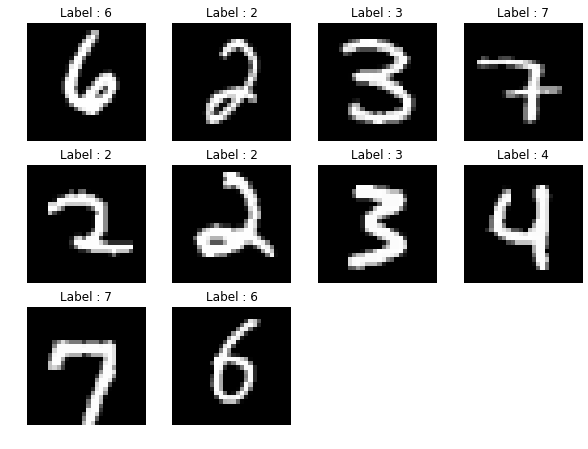

In [18]:
def show_images(images_batch, label_batch=None, n=10):
    
    assert n <= images_batch.shape[0]
    
    fig = plt.figure(figsize=(10, 10))

    for i in range(n):
        
        plt.subplot(4, 4, i+1)
        plt.imshow(images_batch[i, :, :, 0].numpy(), cmap='gray')
        plt.axis('off')
        
        if label_batch is not None:
            plt.title(f"Label : {label_batch[i].numpy()}")
            
    plt.show()
    
show_images(input_batch, label_batch)

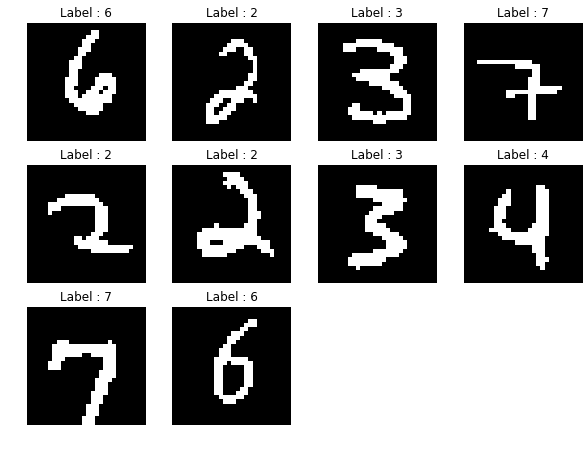

In [19]:
show_images(tf.cast(tf.math.greater_equal(input_batch, 0.5), dtype = tf.float32), label_batch)

## Define Datasets & Deep Auto-Encoder
Datasets parameters

In [20]:
BUFFER_SIZE = 1024
BATCH_SIZE = 256

Processing datasets

In [21]:
# Define processing
mnist_processing = Mnist_Processing(binarize=True, flatten=True)

# Map processing
proc_mnist_train = mnist_train.map(mnist_processing)
proc_mnist_test = mnist_test.map(mnist_processing)

# Batches
batch_mnist_train = proc_mnist_train.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
batch_mnist_test = proc_mnist_test.batch(BATCH_SIZE)

Model :  [Salakhutdinov Auto-Encoder](https://www.cs.toronto.edu/~hinton/science.pdf)

In [22]:
class Deep_AutoEncoder(tf.keras.Model):
    
    def __init__(self):
        
        # Inheritance
        super(Deep_AutoEncoder, self).__init__()
        
        # Encoder layers
        self.encoder_layer1 = tf.keras.layers.Dense(1000, activation='sigmoid', name='encoder_layer1')
        self.encoder_layer2 = tf.keras.layers.Dense(500, activation='sigmoid', name='encoder_layer2')
        self.encoder_layer3 = tf.keras.layers.Dense(250, activation='sigmoid', name='encoder_layer3')
        self.encoder_layer4 = tf.keras.layers.Dense(30, activation='linear', name='encoder_layer4')
        
        # Decoder layers
        self.decoder_layer1 = tf.keras.layers.Dense(250, activation='sigmoid', name='decoder_layer1')
        self.decoder_layer2 = tf.keras.layers.Dense(500, activation='sigmoid', name='decoder_layer2')
        self.decoder_layer3 = tf.keras.layers.Dense(1000, activation='sigmoid', name='decoder_layer3')
        self.decoder_layer4 = tf.keras.layers.Dense(784, activation='sigmoid', name='decoder_layer4')

    def call(self, x):
        
        # Encoder
        x = self.encoder_layer1(x)
        x = self.encoder_layer2(x)
        x = self.encoder_layer3(x)
        x = self.encoder_layer4(x)
        
        # Decoder
        x = self.decoder_layer1(x)
        x = self.decoder_layer2(x)
        x = self.decoder_layer3(x)
        x = self.decoder_layer4(x)
        
        return x

In [23]:
auto_encoder = Deep_AutoEncoder()

In [24]:
def flattened_batch_to_images(flattened_batch, n=None):
    
    if n is None:
        n = flattened_batch.shape[0]
    
    assert flattened_batch.shape == tf.TensorShape([n, 784])
    return tf.expand_dims(tf.reshape(flattened_batch, (n, 28, 28)), axis=3)


def images_to_flattened_batch(images, n=None):
    
    if n is None:
        n = images.shape[0]
        
    assert images.shape == tf.TensorShape([n, 28, 28, 1])
    return tf.reshape(images, (n, 784))

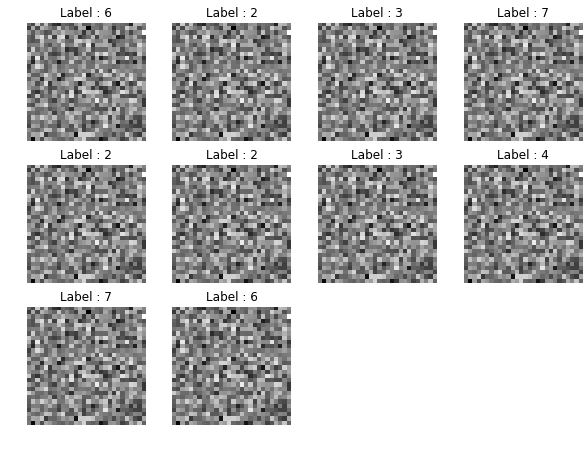

In [25]:
processed_input_batch = images_to_flattened_batch(input_batch)
reconstructed_images = auto_encoder(processed_input_batch)
reconstructed_images = flattened_batch_to_images(reconstructed_images)

show_images(reconstructed_images, label_batch)

## Training

In [26]:
class Model_Trainer:
    
    def __init__(self, model, optimizer, loss_object, early_stopping=False, patience=None, restore_best_model=False, checkpoint_directory=None):
        
        self.model = model
        self.optimizer = optimizer
        self.loss_object = loss_object
        
        self.early_stopping = early_stopping
        self.restore_best_model = restore_best_model
        
        if self.early_stopping or self.restore_best_model:
            if checkpoint_directory is not None and os.path.isdir(checkpoint_directory):
                self.checkpoint = tf.train.Checkpoint(model=self.model)
                self.checkpoint_manager = tf.train.CheckpointManager(
                    self.checkpoint, 
                    directory=checkpoint_directory, 
                    max_to_keep=3
                )
                
            else :
                raise ValueError('A valid directory must be filled for checkpoint_directory.')
                
            self.best_epoch = 1
            self.best_val_loss = np.inf
            self.finally_restored = False
           
        if self.early_stopping:
            try:
                self.patience = int(patience)
                
            except:
                raise Exception('Patience must be an integer value.')
                
        self.history = {'train_loss': [], 'val_loss': []}
        
    def train(self, train_dataset, validation_dataset, epochs, mode='auto-encoder'):
        
        for epoch in tqdm.notebook.tqdm(range(1, epochs+1), desc = 'T R A I N I N G') :

            train_loss = tf.keras.metrics.Mean()
            val_loss = tf.keras.metrics.Mean()

            for data in train_dataset: 
                self.train_step(data, train_loss, mode=mode)

            for data in validation_dataset:
                self.validation_step(data, val_loss, mode=mode)
            
            if (self.restore_best_model or self.early_stopping) and (val_loss.result().numpy() < self.best_val_loss):
                self.best_epoch = epoch
                self.best_val_loss = val_loss.result().numpy()
                self.checkpoint_manager.save()
                
            print (f"[Epoch {epoch}/{epochs}] train_loss: {train_loss.result()} - val_loss: {val_loss.result()}")
            
            self.history['train_loss'].append(train_loss.result().numpy())
            self.history['val_loss'].append(val_loss.result().numpy())

            if self.early_stopping and (epoch - self.best_epoch > self.patience):
                self.checkpoint.restore(self.checkpoint_manager.latest_checkpoint)
                self.finally_restored = True
                
                print(f"Patience exceeded : training done ! Best epoch : {self.best_epoch}. Best model restored.")
                break
                
        if self.restore_best_model and (epoch != self.best_epoch):
            if self.finally_restored:
                pass
            
            else:
                self.checkpoint.restore(self.checkpoint_manager.latest_checkpoint)
                self.finally_restored = True
                print(f"Training done ! Best epoch : {self.best_epoch}. Best model restored.")
        
        return
    
    def train_step(self, data, train_loss, mode):
        
        inputs, labels = data
        
        if mode == 'auto-encoder':
            labels = inputs

        with tf.GradientTape() as tape: 
            outputs = self.model(inputs)
            loss = self.loss_object(labels, outputs)

        gradients = tape.gradient(loss, self.model.trainable_variables)
        self.optimizer.apply_gradients(zip(gradients, self.model.trainable_variables))
        train_loss.update_state(loss)
        
        return
        
    def validation_step(self, data, val_loss, mode):
        
        inputs, labels = data
        
        if mode == 'auto-encoder':
            labels = inputs

        outputs = self.model(inputs)
        loss = self.loss_object(labels, outputs)
        val_loss.update_state(loss)
        
        return

In [27]:
trainer = Model_Trainer(model=auto_encoder, 
                        optimizer=tf.keras.optimizers.Adam(), 
                        loss_object=tf.keras.losses.MeanSquaredError(), 
                        early_stopping=True, 
                        patience=5,
                        restore_best_model=True, 
                        checkpoint_directory='tmp/training_checkpoints')

In [28]:
trainer.train(train_dataset=batch_mnist_train, 
              validation_dataset=batch_mnist_test, 
              epochs=200,
              mode='auto-encoder')

[Epoch 1/200] train_loss: 0.08823712915182114 - val_loss: 0.0864550918340683
[Epoch 2/200] train_loss: 0.08570006489753723 - val_loss: 0.08038924634456635
[Epoch 3/200] train_loss: 0.07729338854551315 - val_loss: 0.07524365931749344
[Epoch 4/200] train_loss: 0.06973978132009506 - val_loss: 0.06613266468048096
[Epoch 5/200] train_loss: 0.06100940331816673 - val_loss: 0.05722152441740036
[Epoch 6/200] train_loss: 0.05546082556247711 - val_loss: 0.05365190654993057
[Epoch 7/200] train_loss: 0.05283593013882637 - val_loss: 0.05191906541585922
[Epoch 8/200] train_loss: 0.05122333765029907 - val_loss: 0.0505623035132885
[Epoch 9/200] train_loss: 0.04999382793903351 - val_loss: 0.049691829830408096
[Epoch 10/200] train_loss: 0.04903557524085045 - val_loss: 0.048785943537950516
[Epoch 11/200] train_loss: 0.0481991283595562 - val_loss: 0.04803759977221489
[Epoch 12/200] train_loss: 0.04745960980653763 - val_loss: 0.0473320409655571
[Epoch 13/200] train_loss: 0.046732522547245026 - val_loss: 0.0

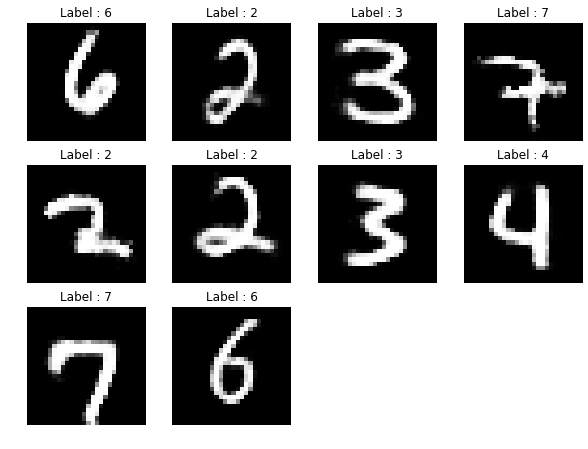

In [29]:
processed_input_batch = images_to_flattened_batch(input_batch)
reconstructed_images = auto_encoder(processed_input_batch)
reconstructed_images = flattened_batch_to_images(reconstructed_images)

show_images(reconstructed_images, label_batch)

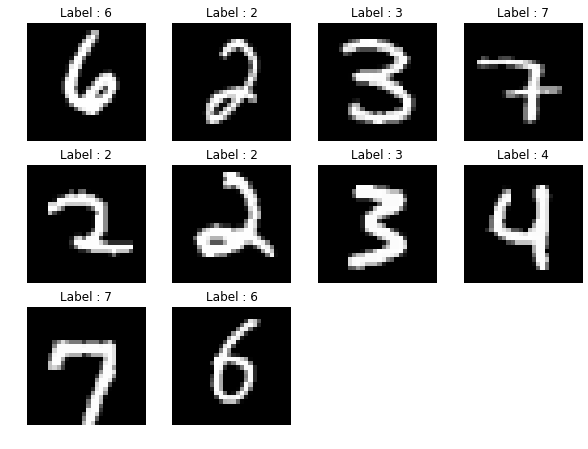

In [30]:
show_images(input_batch, label_batch)

In [31]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=tf.range(1, 151), y=trainer.history['train_loss'], text='Train Loss', name='Train Loss', fill='tozeroy')) # fill down to xaxis
fig.add_trace(go.Scatter(x=tf.range(1, 151), y=trainer.history['val_loss'], text='Validation Loss', name='Validation Loss', fill='tonexty')) # fill to trace0 y

fig.update_layout(
    width=1000,
    height=500,
    plot_bgcolor='rgba(0,0,0,0)',
    xaxis_title='Epochs',
    yaxis_title='Loss (MSE)',
    xaxis=dict(gridcolor='lightgrey'), 
    yaxis=dict(gridcolor='lightgrey'),
)

fig.show()

# Deep Auto-Encoder - Optimization with SGD, Momentum and Nesterov Acceleration
## SGD

In [61]:
class MomentumScheduler:
    
    def __init__(self, u_max=0.995):

        self.u_max = u_max
        
    def __call__(self, step):
        
        u = 1 - 2**(-1-math.log2(np.floor(step/250)+1))
        u_step = min(u, self.u_max)
        
        return u_step

momentum_scheduler = MomentumScheduler(u_max=0.99)
momentum_scheduler.u_max

0.99

In [63]:
# Define processing
mnist_processing = Mnist_Processing(binarize=True, flatten=True)

# Map processing
proc_mnist_train = mnist_train.map(mnist_processing)
proc_mnist_test = mnist_test.map(mnist_processing)

# Batches
batch_mnist_train = proc_mnist_train.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
batch_mnist_test = proc_mnist_test.batch(BATCH_SIZE)

# Model
auto_encoder = Deep_AutoEncoder()

In [64]:
trainer = Model_Trainer(model=auto_encoder, 
                        optimizer=tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.7), # lr : {0.01, 0.001, 0.0001}, momentum : {0.7, 0.9, 0.99}
                        loss_object=tf.keras.losses.MeanSquaredError(), 
                        early_stopping=True, 
                        patience=5,
                        restore_best_model=True, 
                        checkpoint_directory='tmp/training_checkpoints')

trainer.train(train_dataset=batch_mnist_train, 
              validation_dataset=batch_mnist_test, 
              epochs=200,
              mode='auto-encoder')

[Epoch 1/200] train_loss: 0.2177824079990387 - val_loss: 0.18138623237609863
[Epoch 2/200] train_loss: 0.1581319272518158 - val_loss: 0.13996124267578125
[Epoch 3/200] train_loss: 0.12852126359939575 - val_loss: 0.11965924501419067
[Epoch 4/200] train_loss: 0.11361713707447052 - val_loss: 0.10898493230342865
[Epoch 5/200] train_loss: 0.10544175654649734 - val_loss: 0.10282484441995621
[Epoch 6/200] train_loss: 0.10054367780685425 - val_loss: 0.09897564351558685
[Epoch 7/200] train_loss: 0.09739158302545547 - val_loss: 0.09641103446483612
[Epoch 8/200] train_loss: 0.09522908926010132 - val_loss: 0.09461227059364319
[Epoch 9/200] train_loss: 0.09368618577718735 - val_loss: 0.09329704940319061
[Epoch 10/200] train_loss: 0.09254810214042664 - val_loss: 0.09230220317840576
[Epoch 11/200] train_loss: 0.0916578397154808 - val_loss: 0.09152825176715851
[Epoch 12/200] train_loss: 0.09097196161746979 - val_loss: 0.09091197699308395
[Epoch 13/200] train_loss: 0.09041814506053925 - val_loss: 0.090

In [65]:
# Define processing
mnist_processing = Mnist_Processing(binarize=True, flatten=True)

# Map processing
proc_mnist_train = mnist_train.map(mnist_processing)
proc_mnist_test = mnist_test.map(mnist_processing)

# Batches
batch_mnist_train = proc_mnist_train.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
batch_mnist_test = proc_mnist_test.batch(BATCH_SIZE)

# Model
auto_encoder = Deep_AutoEncoder()

trainer = Model_Trainer(model=auto_encoder, 
                        optimizer=tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.99), # lr : {0.01, 0.001, 0.0001}, momentum : {0.7, 0.9, 0.99}
                        loss_object=tf.keras.losses.MeanSquaredError(), 
                        early_stopping=True, 
                        patience=5,
                        restore_best_model=True, 
                        checkpoint_directory='tmp/training_checkpoints')

trainer.train(train_dataset=batch_mnist_train, 
              validation_dataset=batch_mnist_test, 
              epochs=200,
              mode='auto-encoder')

[Epoch 1/200] train_loss: 0.1218523234128952 - val_loss: 0.08858327567577362
[Epoch 2/200] train_loss: 0.08751893788576126 - val_loss: 0.08712856471538544
[Epoch 3/200] train_loss: 0.0866813138127327 - val_loss: 0.08668926358222961
[Epoch 4/200] train_loss: 0.08642750233411789 - val_loss: 0.08652820438146591
[Epoch 5/200] train_loss: 0.08630658686161041 - val_loss: 0.08644092828035355
[Epoch 6/200] train_loss: 0.0862429067492485 - val_loss: 0.08640514314174652
[Epoch 7/200] train_loss: 0.0861976370215416 - val_loss: 0.08637987077236176
[Epoch 8/200] train_loss: 0.08619336038827896 - val_loss: 0.08636043965816498
[Epoch 9/200] train_loss: 0.08617856353521347 - val_loss: 0.08634604513645172
[Epoch 10/200] train_loss: 0.08614456653594971 - val_loss: 0.08633546531200409
[Epoch 11/200] train_loss: 0.08614737540483475 - val_loss: 0.08632654696702957
[Epoch 12/200] train_loss: 0.08613470941781998 - val_loss: 0.08632030338048935
[Epoch 13/200] train_loss: 0.0861256942152977 - val_loss: 0.08631

In [66]:
# Define processing
mnist_processing = Mnist_Processing(binarize=True, flatten=True)

# Map processing
proc_mnist_train = mnist_train.map(mnist_processing)
proc_mnist_test = mnist_test.map(mnist_processing)

# Batches
batch_mnist_train = proc_mnist_train.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
batch_mnist_test = proc_mnist_test.batch(BATCH_SIZE)

# Model
auto_encoder = Deep_AutoEncoder()

trainer = Model_Trainer(model=auto_encoder, 
                        optimizer=tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.99, nesterov=True),#lr : {0.01, 0.001, 0.0001}, momentum : {0.7, 0.9, 0.99}
                        loss_object=tf.keras.losses.MeanSquaredError(), 
                        early_stopping=True, 
                        patience=5,
                        restore_best_model=True, 
                        checkpoint_directory='tmp/training_checkpoints')

trainer.train(train_dataset=batch_mnist_train, 
              validation_dataset=batch_mnist_test, 
              epochs=200,
              mode='auto-encoder')

[Epoch 1/200] train_loss: 0.1221776157617569 - val_loss: 0.08834429085254669
[Epoch 2/200] train_loss: 0.08730963617563248 - val_loss: 0.08703736960887909
[Epoch 3/200] train_loss: 0.08667661994695663 - val_loss: 0.08671393245458603
[Epoch 4/200] train_loss: 0.08645028620958328 - val_loss: 0.08655694872140884
[Epoch 5/200] train_loss: 0.0863325372338295 - val_loss: 0.08647811412811279
[Epoch 6/200] train_loss: 0.0862768217921257 - val_loss: 0.08642303198575974
[Epoch 7/200] train_loss: 0.08622734993696213 - val_loss: 0.08639330416917801
[Epoch 8/200] train_loss: 0.08620544523000717 - val_loss: 0.08637429773807526
[Epoch 9/200] train_loss: 0.08617720752954483 - val_loss: 0.08636316657066345
[Epoch 10/200] train_loss: 0.08616255968809128 - val_loss: 0.0863509327173233
[Epoch 11/200] train_loss: 0.08615366369485855 - val_loss: 0.08634158968925476
[Epoch 12/200] train_loss: 0.08614837378263474 - val_loss: 0.08633241057395935
[Epoch 13/200] train_loss: 0.08613788336515427 - val_loss: 0.0863

In [67]:
# Define processing
mnist_processing = Mnist_Processing(binarize=True, flatten=True)

# Map processing
proc_mnist_train = mnist_train.map(mnist_processing)
proc_mnist_test = mnist_test.map(mnist_processing)

# Batches
batch_mnist_train = proc_mnist_train.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
batch_mnist_test = proc_mnist_test.batch(BATCH_SIZE)

# Model
auto_encoder = Deep_AutoEncoder()

trainer = Model_Trainer(model=auto_encoder, 
                        optimizer=tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9, nesterov=True),#lr : {0.01, 0.001, 0.0001}, momentum : {0.7, 0.9, 0.99}
                        loss_object=tf.keras.losses.MeanSquaredError(), 
                        early_stopping=True, 
                        patience=5,
                        restore_best_model=True, 
                        checkpoint_directory='tmp/training_checkpoints')

trainer.train(train_dataset=batch_mnist_train, 
              validation_dataset=batch_mnist_test, 
              epochs=200,
              mode='auto-encoder')

[Epoch 1/200] train_loss: 0.17312511801719666 - val_loss: 0.12030552327632904
[Epoch 2/200] train_loss: 0.10658770799636841 - val_loss: 0.09880239516496658
[Epoch 3/200] train_loss: 0.0952819362282753 - val_loss: 0.09315980970859528
[Epoch 4/200] train_loss: 0.09160853922367096 - val_loss: 0.09082017838954926
[Epoch 5/200] train_loss: 0.08991789072751999 - val_loss: 0.08958829939365387
[Epoch 6/200] train_loss: 0.08894965052604675 - val_loss: 0.08884306997060776
[Epoch 7/200] train_loss: 0.08835777640342712 - val_loss: 0.08834981918334961
[Epoch 8/200] train_loss: 0.08793482929468155 - val_loss: 0.08800236880779266
[Epoch 9/200] train_loss: 0.08765311539173126 - val_loss: 0.08774609118700027
[Epoch 10/200] train_loss: 0.0874275267124176 - val_loss: 0.08755041658878326
[Epoch 11/200] train_loss: 0.08725348860025406 - val_loss: 0.08739663660526276
[Epoch 12/200] train_loss: 0.08712087571620941 - val_loss: 0.08727254718542099
[Epoch 13/200] train_loss: 0.08701173961162567 - val_loss: 0.08

In [68]:
# Define processing
mnist_processing = Mnist_Processing(binarize=True, flatten=True)

# Map processing
proc_mnist_train = mnist_train.map(mnist_processing)
proc_mnist_test = mnist_test.map(mnist_processing)

# Batches
batch_mnist_train = proc_mnist_train.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
batch_mnist_test = proc_mnist_test.batch(BATCH_SIZE)

# Model
auto_encoder = Deep_AutoEncoder()

trainer = Model_Trainer(model=auto_encoder, 
                        optimizer=tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.7, nesterov=True),#lr : {0.01, 0.001, 0.0001}, momentum : {0.7, 0.9, 0.99}
                        loss_object=tf.keras.losses.MeanSquaredError(), 
                        early_stopping=True, 
                        patience=5,
                        restore_best_model=True, 
                        checkpoint_directory='tmp/training_checkpoints')

trainer.train(train_dataset=batch_mnist_train, 
              validation_dataset=batch_mnist_test, 
              epochs=200,
              mode='auto-encoder')

[Epoch 1/200] train_loss: 0.21918749809265137 - val_loss: 0.18171438574790955
[Epoch 2/200] train_loss: 0.1581728309392929 - val_loss: 0.13961975276470184
[Epoch 3/200] train_loss: 0.12817732989788055 - val_loss: 0.11918757110834122
[Epoch 4/200] train_loss: 0.11322011053562164 - val_loss: 0.1085534319281578
[Epoch 5/200] train_loss: 0.10508938878774643 - val_loss: 0.10246966034173965
[Epoch 6/200] train_loss: 0.10025082528591156 - val_loss: 0.09869042038917542
[Epoch 7/200] train_loss: 0.09714397042989731 - val_loss: 0.09618207067251205
[Epoch 8/200] train_loss: 0.09504221379756927 - val_loss: 0.09442656487226486
[Epoch 9/200] train_loss: 0.093533456325531 - val_loss: 0.09314441680908203
[Epoch 10/200] train_loss: 0.09241747856140137 - val_loss: 0.09217485785484314
[Epoch 11/200] train_loss: 0.09155283868312836 - val_loss: 0.09142042696475983
[Epoch 12/200] train_loss: 0.09088101983070374 - val_loss: 0.09081941097974777
[Epoch 13/200] train_loss: 0.09033680707216263 - val_loss: 0.0903

In [69]:
# Define processing
mnist_processing = Mnist_Processing(binarize=True, flatten=True)

# Map processing
proc_mnist_train = mnist_train.map(mnist_processing)
proc_mnist_test = mnist_test.map(mnist_processing)

# Batches
batch_mnist_train = proc_mnist_train.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
batch_mnist_test = proc_mnist_test.batch(BATCH_SIZE)

# Model
auto_encoder = Deep_AutoEncoder()

trainer = Model_Trainer(model=auto_encoder, 
                        optimizer=tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.999), # lr : {0.01, 0.001, 0.0001}, momentum : {0.7, 0.9, 0.99}
                        loss_object=tf.keras.losses.MeanSquaredError(), 
                        early_stopping=True, 
                        patience=5,
                        restore_best_model=True, 
                        checkpoint_directory='tmp/training_checkpoints')

trainer.train(train_dataset=batch_mnist_train, 
              validation_dataset=batch_mnist_test, 
              epochs=200,
              mode='auto-encoder')

[Epoch 1/200] train_loss: 0.12163077294826508 - val_loss: 0.09386500716209412
[Epoch 2/200] train_loss: 0.09342366456985474 - val_loss: 0.09386755526065826
[Epoch 3/200] train_loss: 0.0929848775267601 - val_loss: 0.09306492656469345
[Epoch 4/200] train_loss: 0.09244038164615631 - val_loss: 0.0926005020737648
[Epoch 5/200] train_loss: 0.09207472205162048 - val_loss: 0.09189639240503311
[Epoch 6/200] train_loss: 0.09154089540243149 - val_loss: 0.09164397418498993
[Epoch 7/200] train_loss: 0.09128285199403763 - val_loss: 0.0914253294467926
[Epoch 8/200] train_loss: 0.09101218730211258 - val_loss: 0.09119008481502533
[Epoch 9/200] train_loss: 0.09080960601568222 - val_loss: 0.0910014808177948
[Epoch 10/200] train_loss: 0.09069681912660599 - val_loss: 0.09092336893081665
[Epoch 11/200] train_loss: 0.09050703048706055 - val_loss: 0.09070125967264175
[Epoch 12/200] train_loss: 0.09039115905761719 - val_loss: 0.09056352823972702
[Epoch 13/200] train_loss: 0.09027984738349915 - val_loss: 0.0905

In [70]:
# Define processing
mnist_processing = Mnist_Processing(binarize=True, flatten=True)

# Map processing
proc_mnist_train = mnist_train.map(mnist_processing)
proc_mnist_test = mnist_test.map(mnist_processing)

# Batches
batch_mnist_train = proc_mnist_train.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
batch_mnist_test = proc_mnist_test.batch(BATCH_SIZE)

# Model
auto_encoder = Deep_AutoEncoder()

trainer = Model_Trainer(model=auto_encoder, 
                        optimizer=tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.999, nesterov=True), # lr : {0.01, 0.001, 0.0001}, momentum : {0.7, 0.9, 0.99}
                        loss_object=tf.keras.losses.MeanSquaredError(), 
                        early_stopping=True, 
                        patience=5,
                        restore_best_model=True, 
                        checkpoint_directory='tmp/training_checkpoints')

trainer.train(train_dataset=batch_mnist_train, 
              validation_dataset=batch_mnist_test, 
              epochs=200,
              mode='auto-encoder')

[Epoch 1/200] train_loss: 0.12094929814338684 - val_loss: 0.09412877261638641
[Epoch 2/200] train_loss: 0.0931943953037262 - val_loss: 0.09315989166498184
[Epoch 3/200] train_loss: 0.09252654016017914 - val_loss: 0.09279219806194305
[Epoch 4/200] train_loss: 0.09174911677837372 - val_loss: 0.09167126566171646
[Epoch 5/200] train_loss: 0.09130943566560745 - val_loss: 0.09126453101634979
[Epoch 6/200] train_loss: 0.09091455489397049 - val_loss: 0.09103745222091675
[Epoch 7/200] train_loss: 0.09068381041288376 - val_loss: 0.09082546085119247
[Epoch 8/200] train_loss: 0.09048407524824142 - val_loss: 0.0906582623720169
[Epoch 9/200] train_loss: 0.09028809517621994 - val_loss: 0.09046442061662674
[Epoch 10/200] train_loss: 0.09020280838012695 - val_loss: 0.09047694504261017
[Epoch 11/200] train_loss: 0.09013739973306656 - val_loss: 0.09035624563694
[Epoch 12/200] train_loss: 0.09009011089801788 - val_loss: 0.09030397236347198
[Epoch 13/200] train_loss: 0.09004445374011993 - val_loss: 0.09024

In [72]:
# Define processing
mnist_processing = Mnist_Processing(binarize=True, flatten=True)

# Map processing
proc_mnist_train = mnist_train.map(mnist_processing)
proc_mnist_test = mnist_test.map(mnist_processing)

# Batches
batch_mnist_train = proc_mnist_train.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
batch_mnist_test = proc_mnist_test.batch(BATCH_SIZE)

# Model
auto_encoder = Deep_AutoEncoder()

trainer = Model_Trainer(model=auto_encoder, 
                        optimizer=tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.995, nesterov=True), # lr : {0.01, 0.001, 0.0001}, momentum : {0.7, 0.9, 0.99}
                        loss_object=tf.keras.losses.MeanSquaredError(), 
                        early_stopping=True, 
                        patience=5,
                        restore_best_model=True, 
                        checkpoint_directory='tmp/training_checkpoints')

trainer.train(train_dataset=batch_mnist_train, 
              validation_dataset=batch_mnist_test, 
              epochs=200,
              mode='auto-encoder')

[Epoch 1/200] train_loss: 0.12152321636676788 - val_loss: 0.09084834158420563
[Epoch 2/200] train_loss: 0.0894932746887207 - val_loss: 0.08908694237470627
[Epoch 3/200] train_loss: 0.0884450376033783 - val_loss: 0.08827563375234604
[Epoch 4/200] train_loss: 0.08789700269699097 - val_loss: 0.08792627602815628
[Epoch 5/200] train_loss: 0.08765871822834015 - val_loss: 0.08772768080234528
[Epoch 6/200] train_loss: 0.08746538311243057 - val_loss: 0.08759243786334991
[Epoch 7/200] train_loss: 0.08734956383705139 - val_loss: 0.08749718964099884
[Epoch 8/200] train_loss: 0.08726983517408371 - val_loss: 0.08742643892765045
[Epoch 9/200] train_loss: 0.0871729701757431 - val_loss: 0.08732153475284576
[Epoch 10/200] train_loss: 0.08706118166446686 - val_loss: 0.08720263838768005
[Epoch 11/200] train_loss: 0.08698827773332596 - val_loss: 0.08712111413478851
[Epoch 12/200] train_loss: 0.08690916746854782 - val_loss: 0.08704464137554169
[Epoch 13/200] train_loss: 0.08686726540327072 - val_loss: 0.087

# Deep Auto-Encoder - Optimization with SGD, Momentum and Nesterov Acceleration

In [16]:
sparse_tensor = tf.sparse.SparseTensor(indices=[[0, 0], [1, 2]],
                                       values=[1, 2],
                                       dense_shape=[3, 4])
print(sparse_tensor, "\n")

SparseTensor(indices=tf.Tensor(
[[0 0]
 [1 2]], shape=(2, 2), dtype=int64), values=tf.Tensor([1 2], shape=(2,), dtype=int32), dense_shape=tf.Tensor([3 4], shape=(2,), dtype=int64)) 



In [17]:
print(tf.sparse.to_dense(sparse_tensor))

tf.Tensor(
[[1 0 0 0]
 [0 0 2 0]
 [0 0 0 0]], shape=(3, 4), dtype=int32)


In [20]:
updated_sparse_tensor = tf.constant(6) * sparse_tensor

print(updated_sparse_tensor)

SparseTensor(indices=tf.Tensor(
[[0 0]
 [1 2]], shape=(2, 2), dtype=int64), values=tf.Tensor([ 6 12], shape=(2,), dtype=int32), dense_shape=tf.Tensor([3 4], shape=(2,), dtype=int64))


In [52]:
sparse_tensor / tf.constant(4)

In [55]:
x = tf.IndexedSlices(
    tf.constant([0.1], shape=[1, 1], dtype=tf.float32),
    tf.constant([0]), 
    tf.constant([2, 1]))
x

In [58]:
x.dense_shape

<tf.Tensor: shape=(2,), dtype=int32, numpy=array([2, 1], dtype=int32)>

In [59]:
dtype = tf.float32

var0 = tf.Variable([[1.0], [2.0]], dtype=dtype)
var1 = tf.Variable([[3.0], [4.0]], dtype=dtype)

grads0 = tf.IndexedSlices(
    tf.constant([0.1], shape=[1, 1], dtype=dtype),
    tf.constant([0]), 
    tf.constant([2, 1]))

grads1 = tf.IndexedSlices(
    tf.constant([0.01], shape=[1, 1], dtype=dtype),
    tf.constant([1]), 
    tf.constant([2, 1]))

In [62]:
tf.add(grads0, grads1)

<tf.Tensor: shape=(2, 1), dtype=float32, numpy=
array([[0.1 ],
       [0.01]], dtype=float32)>

In [67]:
tf.constant(5.0) * tf.Variable(tf.ones(tf.TensorShape([2, 1]))) + grads0

<tf.Tensor: shape=(2, 1), dtype=float32, numpy=
array([[5.1],
       [5. ]], dtype=float32)>

In [ ]:
class SGD(tf.keras.optimizers.Optimizer): # Add a method ._scheduled_momentum_
    
    """ Stochastic Gradient Descent implementation, including Momentum and Nesterov acceleration.
    
    References : 
    - https://arxiv.org/pdf/1212.0901.pdf
    - http://www.cs.toronto.edu/~hinton/absps/momentum.pdf
    - https://github.com/tensorflow/tensorflow/blob/v2.2.0/tensorflow/python/keras/optimizer_v2/optimizer_v2.py
    - https://github.com/tensorflow/tensorflow/blob/v2.1.0/tensorflow/python/keras/optimizer_v2/gradient_descent.py
    - https://github.com/tensorflow/addons/blob/master/tensorflow_addons/optimizers/rectified_adam.py
    - https://github.com/tensorflow/addons/blob/master/tensorflow_addons/optimizers/novograd.py
    
    """
    
    def __init__(self, learning_rate=0.01, momentum=0.0, nesterov=False, name='SGD', **kwargs):
        
        # Inheritance
        super(SGD, self).__init__(name, **kwargs)
        
        # Hyperparameters
        self._set_hyper('learning_rate', kwargs.get('lr', learning_rate))
        self._set_hyper('decay', self._initial_decay)
        self._set_hyper('momentum', momentum)
        self.nesterov = nesterov
        
    def _create_slots(self, var_list):
        
        for var in var_list:
            self.add_slot(var, 'momentum', initializer='zeros')
            
        return
            
    def _resource_apply_dense(self, grad, var):
        
        var_dtype = var.dtype.base_dtype
        
        lr_t = self._decayed_lr(var_dtype)
        m_t = self._get_hyper('momentum', var_dtype)
        
        v = self.get_slot(var, 'momentum')
        v_t = v.assign(m_t * v - lr_t * grad, use_locking=self._use_locking)
        
        if self.nesterov:
            var_update = var.assign_add(- m_t * v + (1 + m_t) * v_t, use_locking=self._use_locking)
            
        else:
            var_update = var.assign_add(v_t, use_locking=self._use_locking)
            
        return tf.group(*[var_update, v_t])
        
    def _resource_apply_sparse(self, grad, var, indices):
        
        var_dtype = var.dtype.base_dtype
        
        lr_t = self._decayed_lr(var_dtype)
        m_t = self._get_hyper('momentum', var_dtype)
        
        v = self.get_slot(var, 'momentum')
        # v_t = v.assign(m_t * v - lr_t * grad, use_locking=self._use_locking)
        
        
        
        return tf.group(*[var_update, v_t])
    
    def get_config(self):
        
        config = super(SGD, self).get_config()
        config.update(
            {
                'learning_rate': self._serialize_hyperparameter('learning_rate'),
                'decay': self._serialize_hyperparameter('decay'),
                'momentum': self._serialize_hyperparameter('momentum'),
                'nesterov': self.nesterov,
            }
        )
        
        return config

In [ ]:
class TimeLearningRate(object):
    
    def __init__(self, learning_rate=0.01, decay=0.):
        
        self.learning_rate = learning_rate
        self.decay = decay
        
    def __call__(self, step):
        
        lr = self.learning_rate * (1. / (1. + self.decay * step))
        
        return lr

In [ ]:
class MomentumScheduler(object):
    
    def __init__(self, u_max=0.995):
        
        self.u_max = u_max
        
    def __call__(self, step):
        
        u = 1 - 2**(-1-math.log2(np.floor(step/250)+1))
        u_step = min(u, self.u_max)
        
        return u_step

In [ ]:
class Stochastic_Gradient_Descent(object):
    
    def __init__(self, learning_rate=0.01, momentum=0.0, nesterov=False):
        
        self.learning_rate = learning_rate
        self.momentum = momentum
        self.nesterov = nesterov
        
        self.velocities = False
        self.iterations = 0
     
    def apply_gradients(self, gradients, trainable_variables):
        
        if self.velocities is False :
            self.initialize_velocities(trainable_variables)
            
        momentum = self.compute_momentum()
        lr = self.compute_learning_rate()
        new_velocities = []
        
        for velocity, gradient, variable in zip(self.velocities, gradients, trainable_variables):
            
            v = momentum * velocity - lr * gradient
            new_velocities.append(v)
            
            if self.nesterov:
                
                variable.assign(variable - momentum * velocity + (1 + momentum) * v)
            
            else :
                
                variable.assign(variable + v)
            
        self.velocities = new_velocities
        self.iterations += 1
            
        return 
        
    def initialize_velocities(self, trainable_variables):
        
        self.velocities = [tf.zeros(v.shape) for v in trainable_variables]
        
        return
    
    def reset_states(self):
        
        self.velocities = False
        self.iterations = 0
        
        return
    
    def compute_learning_rate(self): # get_learning_rate(self):
        
        if callable(self.learning_rate):
            
            return self.learning_rate(self.iterations)
        
        return self.learning_rate
    
    def compute_momentum(self): # get_momentum(self):
        
        if callable(self.momentum):
            
            return self.momentum(self.iterations)
        
        return self.momentum

## Training Loop

In [ ]:
EPOCHS = 100
DATASET_LENGTH = 60000

momentum = MomentumScheduler(u_max=0.995)
optimizer = StochasticGradientDescent(learning_rate=0.0001, momentum=momentum, nesterov=True)


for epoch in tqdm_notebook(iterable = range(EPOCHS), total = EPOCHS, desc = 'T R A I N I N G') :
    
    train_loss.reset_states()
    test_loss.reset_states()
    
    for input_batch, _ in tqdm_notebook(mnist_train, total = int(np.ceil(DATASET_LENGTH/BATCH_SIZE)), 
                                                     desc = 'Epoch {}/{}'.format(epoch+1, EPOCHS),
                                                     leave=False): 
        
        
        batch_size = input_batch.shape[0]
        inputs = tf.reshape(tf.squeeze(input_batch), (batch_size, 784))
        
        with tf.GradientTape() as tape :
            
            reconstructed_inputs = deep_autoencoder(inputs)
            loss = loss_object(inputs, reconstructed_inputs)
        
        gradients = tape.gradient(loss, deep_autoencoder.trainable_variables)
        optimizer.apply_gradients(gradients, deep_autoencoder.trainable_variables)
    
        train_loss(loss)
        
    
    for input_batch, _ in mnist_test:
        
        batch_size = input_batch.shape[0]
        inputs = tf.reshape(tf.squeeze(input_batch), (batch_size, 784))
        
        reconstructed_inputs = deep_autoencoder(inputs)
        loss = loss_object(inputs, reconstructed_inputs)
        
        test_loss(loss)
        
    
    print ('[Epoch {}/{}] Train Loss : {} - Test Loss : {}\n'.format(epoch+1,
                                                                     EPOCHS,
                                                                     train_loss.result(), 
                                                                     test_loss.result()))

In [ ]:
input_batch, _ = next(iter(mnist_test))
    
show_images(input_batch)

In [ ]:
input_images = tf.reshape(input_batch[:10], (10, 784))

output_images = deep_autoencoder(input_images)
output_images = tf.reshape(output_images, (10, 28, 28, 1))

show_images(output_images)